In [1]:
from lxml import etree
from collections import OrderedDict
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
import numpy as np
sns.set()

In [2]:
datamap=OrderedDict()
datamap["ES"]="earthscience.stackexchange.com"
datamap["SL"]="sustainability.stackexchange.com"

In [3]:
def read_tags(filename):
    logtags=[]
    for row in open(filename,"r"):
        logtags.append(row.split(",")[0].strip().lower())   
    return logtags

def read_prog_lang(filename):
    data=OrderedDict()
    f=open(filename,"r")
    for l in f:
        row=l.split("\t")
        key=row[0].lower().strip()
        data[key]=[]
        for element in row[1].split(","):
            data[key].append(element.strip().lower())
    return data

def atleast_one(a, b):
    return not set(a).isdisjoint(b)

def refine_tags(tags):
    if tags!=None:
        l=tags.split('><')
        l=[i.replace('>','').replace('<','').lower() for i in l]
        return l
    else:
        return ["???"]

def init_data(taglist):
    data=OrderedDict()
    for tag in taglist:
        data[tag]=OrderedDict()
        for fname in datamap:
            data[tag][fname]=0
    return data

In [4]:
folder="Desalination/"
keyword="desalination"
logtags=list(set(read_tags(folder+keyword+" - Sheet1.csv")))

prog_tags=read_prog_lang(folder+keyword+" - Sheet2.tsv")

# for i in prog_tags:
#     logtags.extend(prog_tags[i])
# logtags=list(set(logtags))

print(logtags)

['sea-ice', 'water-table', 'water-management', 'sea-level', 'seawater', 'water-vapour', 'water', 'underground-water', 'water-conservation', 'ocean', 'groundwater']


In [5]:
def common_tag_csv(data):
    f=open(folder+"Temp-Sheet-2.csv","w")
    f.write(",")
    for fname in datamap:
        f.write(fname+",")
    f.write("\n")
    for tag in data:
        f.write(tag+",")
        for element in data[tag]:
            f.write(str(data[tag][element])+",")
        f.write("\n")
    f.close()
    
    fr=open(folder+"Temp-Sheet-2.csv","r")
    fw=open(folder+"Modified-Sheet-2.csv","w")
    fw2=open(folder+"Sheet-2.csv","w")
    s=fr.readline()
    fw.write(s)
    fw2.write(s)
    for l in fr:
        row=l.split(",")
        temp=Counter(row)
        print(temp)
        if temp['0'] <=4:
            fw.write(l)
        if temp['0']!=6:
            fw2.write(l)
    fw.close()
    fr.close()
    fw2.close()
        
        

In [7]:
def count_tags(taglist):
    data=init_data(taglist)
    #print(data)
    for fname in datamap:
        print(fname)
        if fname=="stackoverflow" and datamap[fname]=="stackoverflow.com-":
            datamap[fname]=datamap[fname]+"Tags"
        f=open("data/"+datamap[fname]+"/Tags.xml","rb")
        next(f)
        next(f)
        count=0
        for l in f:
            try:
                rows=etree.XML(l)  
                if  rows.get("TagName").lower() in taglist:
                    tagname=rows.get("TagName").lower()
                    question=rows.get("Count")
                    data[tagname][fname]=question
                    count=count+int(question)
                    #print(tagname,question)
            except:
                print(l)
               

        print(count)
    return data

In [51]:
data=count_tags(logtags)
print(data)
common_tag_csv(data)

ES
b'</tags>'
447
SL
b'</tags>'
104
OrderedDict([('seawater', OrderedDict([('ES', 0), ('SL', '6')])), ('water-conservation', OrderedDict([('ES', 0), ('SL', '6')])), ('sea-level', OrderedDict([('ES', '59'), ('SL', 0)])), ('water-vapour', OrderedDict([('ES', '12'), ('SL', 0)])), ('water', OrderedDict([('ES', '85'), ('SL', '71')])), ('ocean', OrderedDict([('ES', '213'), ('SL', 0)])), ('water-management', OrderedDict([('ES', 0), ('SL', '21')])), ('water-table', OrderedDict([('ES', '10'), ('SL', 0)])), ('sea-ice', OrderedDict([('ES', '15'), ('SL', 0)])), ('underground-water', OrderedDict([('ES', '4'), ('SL', 0)])), ('groundwater', OrderedDict([('ES', '49'), ('SL', 0)]))])
Counter({'seawater': 1, '0': 1, '6': 1, '\n': 1})
Counter({'water-conservation': 1, '0': 1, '6': 1, '\n': 1})
Counter({'sea-level': 1, '59': 1, '0': 1, '\n': 1})
Counter({'water-vapour': 1, '12': 1, '0': 1, '\n': 1})
Counter({'water': 1, '85': 1, '71': 1, '\n': 1})
Counter({'ocean': 1, '213': 1, '0': 1, '\n': 1})
Counter({

In [53]:
def plot_monthly_bargraph(data_all,data,data_no,title,ylabel,opr):
    plt.close()
    plt.clf()
    plt.subplots(figsize=(5,3),dpi=600)
    yAll=[data_all[i] for i in data_all]
    y=[data[i] for i in data]
    yNo=[data_no[i] for i in data_no]
    x=[i for i in range(len(data_all))]
    xticks=[i.split('-')[0] for i in data_all]
    
    for xi, i, j , k in zip(x, yAll, y, yNo):
        if j>k:
            plt.bar(xi,i,color='b')
            plt.bar(xi,j,color='g')
            plt.bar(xi,k,color='C2')
        else:
            plt.bar(xi,i,color='b')
            plt.bar(xi,k,color='C2')
            plt.bar(xi,j,color='g')
            
    s=10
    plt.scatter(2,-5,label="Ordinary",color='b',s=s)
    #plt.bar(x,yAll)
    plt.scatter(2,-5,label="Successful",color='g',s=s)
    plt.scatter(2,-5,label="Unsuccessfull",color='C2',s=s)
    gap=1
    plt.xticks(x[::gap],xticks[::gap])
    plt.title(title.upper())
    plt.ylabel(ylabel)
    plt.legend(loc="upper right",prop={'size': 6})
    plt.ylim(0,None)
    if opr==1:
        plt.savefig("Images/"+title+".png")
    else:
        
        plt.show()
    plt.clf()

    
def plot_monthly_cumgraph(data,title,opr):
    plt.close()
    plt.clf()
    y=np.cumsum([data[i] for i in data])
    x=[i for i in range(len(data))]
    xticks=[i.split('-')[0] for i in data]
    plt.bar(x,y)
    gap=12
    plt.xticks(x[::gap],xticks[::gap],rotation=30)
    plt.title(title.upper())
    plt.ylabel("No. of Questions")
    if opr==1:
        plt.savefig("Images/"+title+".png")
    else:
        plt.show()
    plt.clf()

def init_o_data():
    data=OrderedDict()
    start_year=2013
    start_month=8
    end_year=2017
    end_month=12
    for year in range(start_year,end_year+1):
#         #for month in range(start_month,end_month+1):
#             #print(year,month)
#             temp=str(month)
#             if len(temp)==1:
#                 temp="0"+temp
            data[str(year)]=0
        #start_month=1
    if "2018" not in data:
        data["2018"]=0
    return data

In [33]:
def distribute_posts(website,logtags):
    if fname=="stackoverflow" and datamap[fname]=="stackoverflow.com-":
        datamap[fname]=datamap[fname]+"Posts"   
    
    f=open("data/"+datamap[website]+"/Posts.xml","rb")
    next(f)
    next(f)
    data=init_o_data()
    data_all=init_o_data()
    data_no=init_o_data()
    count=0
    tagCluster=[]
    userId={}
    vcList=[]
    for l in f:
        try:
            row=etree.XML(l) 
            Qid=row.get("Id")
            posttypeid=row.get("PostTypeId") 
            acceptedanswerID=row.get("AcceptedAnswerId")
            tags=refine_tags(row.get("Tags"))
            viewCount=row.get("ViewCount")
            OwnerUserId=row.get("OwnerUserId")
            answerCount=row.get("AnswerCount")
            if viewCount:
                viewCount=int(viewCount)
            else:
                vieCount=0
            if posttypeid=="1":
                if atleast_one(tags,logtags):
                    date=row.get("CreationDate")
                    key=date.split("T")[0][0:4]
                    # ViewC List
                    vcList.append(viewCount)
                    if key not in data_all:
                        data_all[key]=0
#                         data[key]=0
#                         data_no[key]=0
                    #data_all[key]+=viewCount
                    data_all[key]+=1
                    tagCluster.extend(tags)
                    #userId.append([Qid,OwnerUserId])
                    userId[OwnerUserId]=Qid

                    if answerCount=="0":
                        data_no[key]+=1
            
            if posttypeid=="1" and acceptedanswerID!=None:
                # Means it has an accepted answer                
                if atleast_one(tags,logtags):
                    # Atleast one logging tag
                    #print(tags)
                    date=row.get("CreationDate")
                    key=date.split("T")[0][0:4]
                    if key not in data:
                        data[key]=0
                    #data[key]+=viewCount
                    data[key]+=1
           
                
        except:
            print(l)
    return data, data_all, tagCluster, userId, vcList, data_no

b'</posts>'
OrderedDict([('2013', 0), ('2014', 5), ('2015', 9), ('2016', 18), ('2017', 22), ('2018', 6)]) OrderedDict([('2013', 0), ('2014', 52), ('2015', 40), ('2016', 34), ('2017', 26), ('2018', 5)])


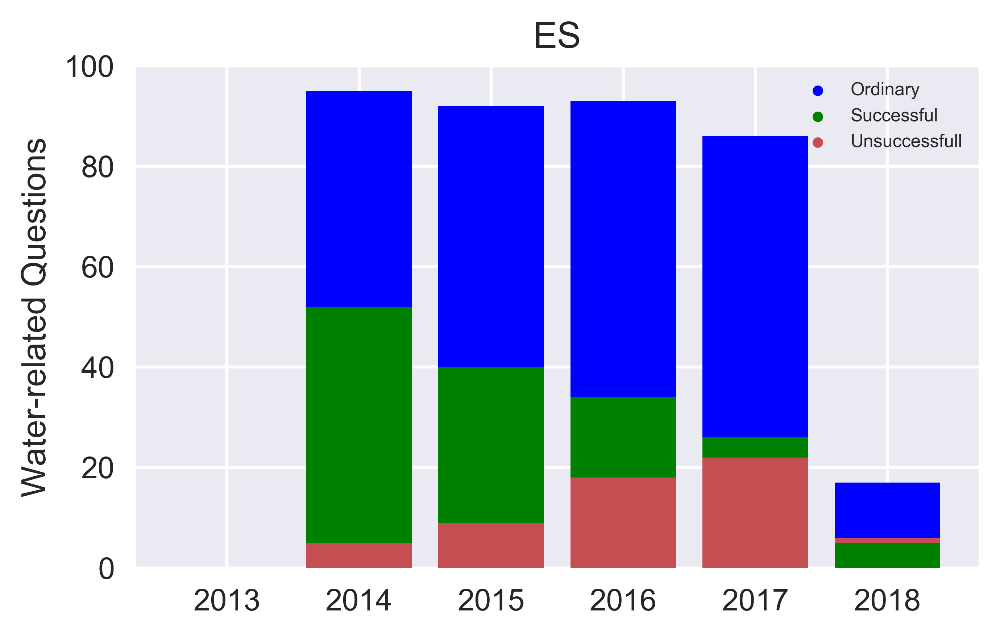

b'</posts>'
OrderedDict([('2013', 0), ('2014', 0), ('2015', 0), ('2016', 0), ('2017', 4), ('2018', 2)]) OrderedDict([('2013', 24), ('2014', 4), ('2015', 5), ('2016', 2), ('2017', 1), ('2018', 0)])


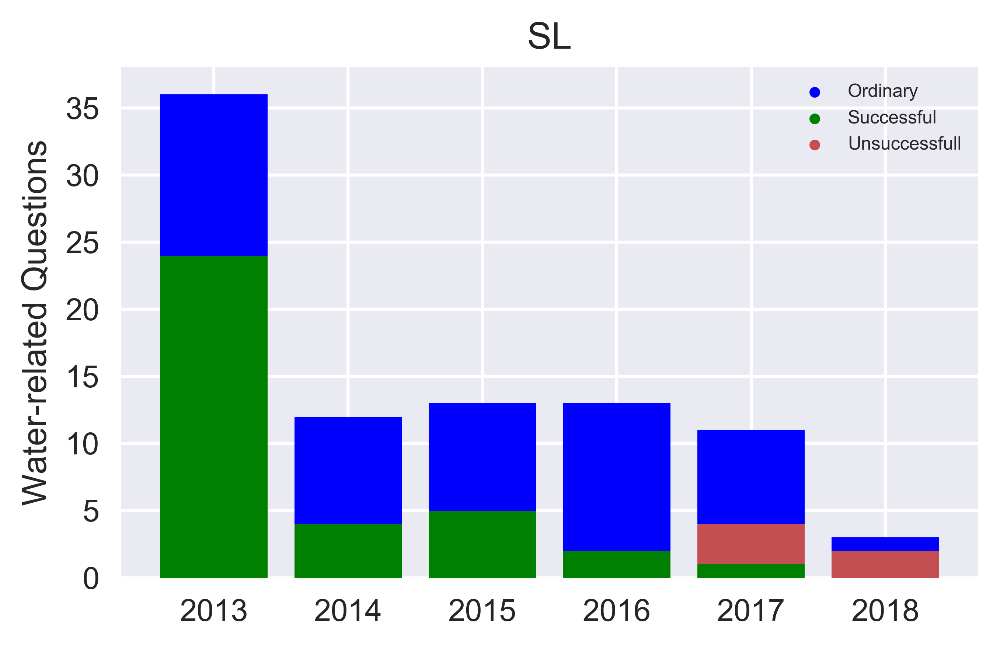

In [54]:
for fname in list(datamap.keys())[0:2]:
    data, data_all, tags,userId,vcList, data_no=distribute_posts(fname,logtags)
    #print(data,data_all)
    #print(tags)
    print(data_no,data)
    plot_monthly_bargraph(data_all,data,data_no,fname,"Water-related Questions",0)
    #plot_monthly_bargraph(data,fname+": Logging Questions with selected answers",0)
    #plot_monthly_bargraph(data,fname+": Logging Questions with selected answers",0)
#     plot_monthly_cumgraph(data_all,fname+": Cummulative Logging Questions",0)
#     plot_monthly_cumgraph(data,fname+": Cummulative Logging Questions with selected answers",0)
    pickle.dump(data,open(folder+fname+"data.pickle","wb"))
    pickle.dump(data_all,open(folder+fname+"data.all.pickle","wb"))
    pickle.dump(data_no,open(folder+fname+"datano.all.pickle","wb"))
    pickle.dump(tags,open(folder+fname+".tags.pickle","wb"))
    pickle.dump(userId,open(folder+fname+".userid.pickle","wb"))
    #pickle.dump(vcList,open(folder+fname+".vcList.pickle","wb"))

c:\program files (x86)\python36-32\lib\site-packages\numpy\core\fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
c:\program files (x86)\python36-32\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


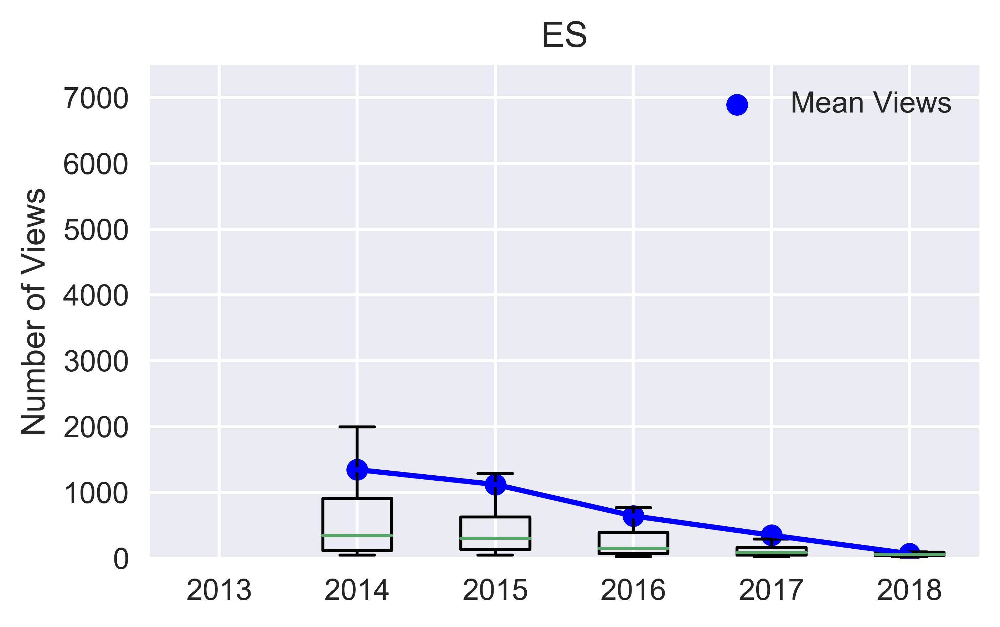

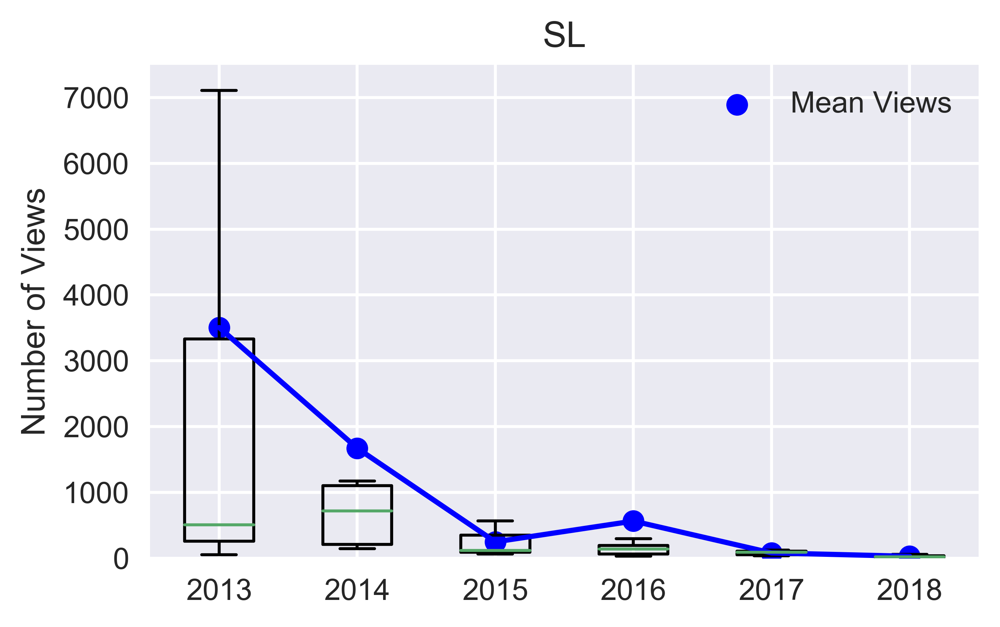

In [13]:
# Boxplots
sns.reset_defaults()

def plot_yearly(data_all,data,title,ylabel,opr):
    plt.close()
    plt.clf()
    plt.subplots(figsize=(5,3),dpi=600)
    yAll=[np.mean(data_all[i]) for i in data_all]
    y=[np.mean(data[i]) for i in data]
    x=[i for i in range(len(data_all))]
    xticks=[i.split('-')[0] for i in data_all]
    plt.plot(x,yAll)
    plt.plot(x,y)
    plt.scatter(x,yAll,label="ES")
    plt.scatter(x,y,label="SL")
    gap=1
    plt.xticks(x[::gap],xticks[::gap])
    plt.title(title.upper())
    plt.ylabel(ylabel)
    plt.legend(loc="upper right",prop={'size': 6})
    plt.ylim(0,None)
    if opr==1:
        plt.savefig("Images/"+title+".png")
    else:
        
        plt.show()
    plt.clf()
sns.set()  
def boxplots():
   
    for fname in datamap:
        data=pickle.load(open(folder+fname+"vcall.all.pickle","rb"))
        #print(data)
        plt.close()
        plt.subplots(figsize=(5,3),dpi=600)
        plt.boxplot([data[i] for i in data])
        plt.plot([i+1 for i in range(len(data))],[np.mean(data[i]) for i in data],color='b')
        plt.scatter([i+1 for i in range(len(data))],[np.mean(data[i]) for i in data],label="Mean Views",color='b')
        plt.xticks([i+1 for i in range(len(data))],[i for i in data])
        plt.ylabel("Number of Views")
        plt.ylim(0,7500)
        plt.legend(loc="upper right")
        plt.title(fname)
        plt.show()
boxplots()

c:\program files (x86)\python36-32\lib\site-packages\numpy\core\fromnumeric.py:2909: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
c:\program files (x86)\python36-32\lib\site-packages\numpy\core\_methods.py:80: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


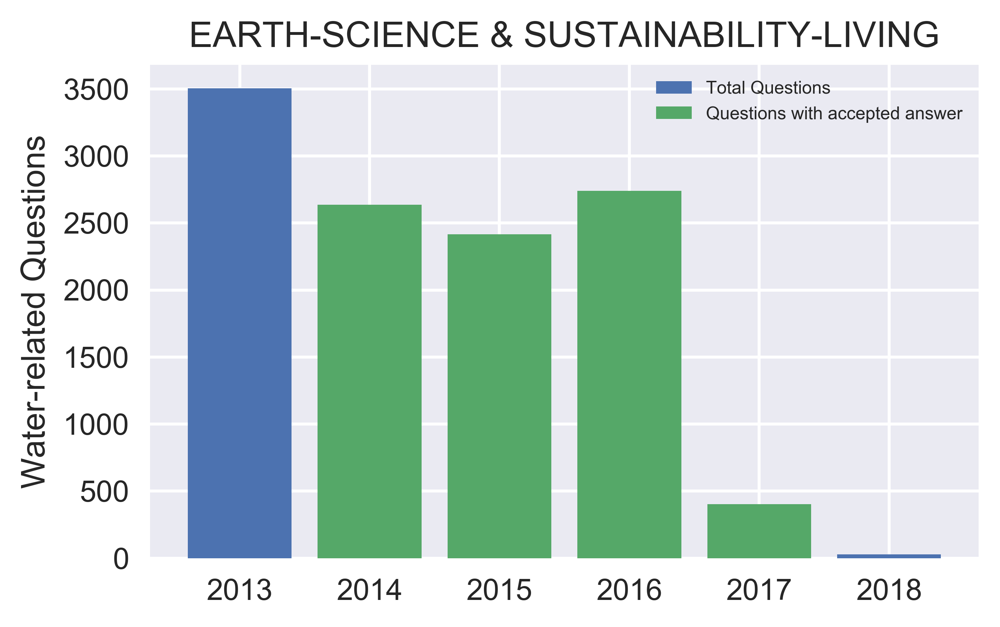

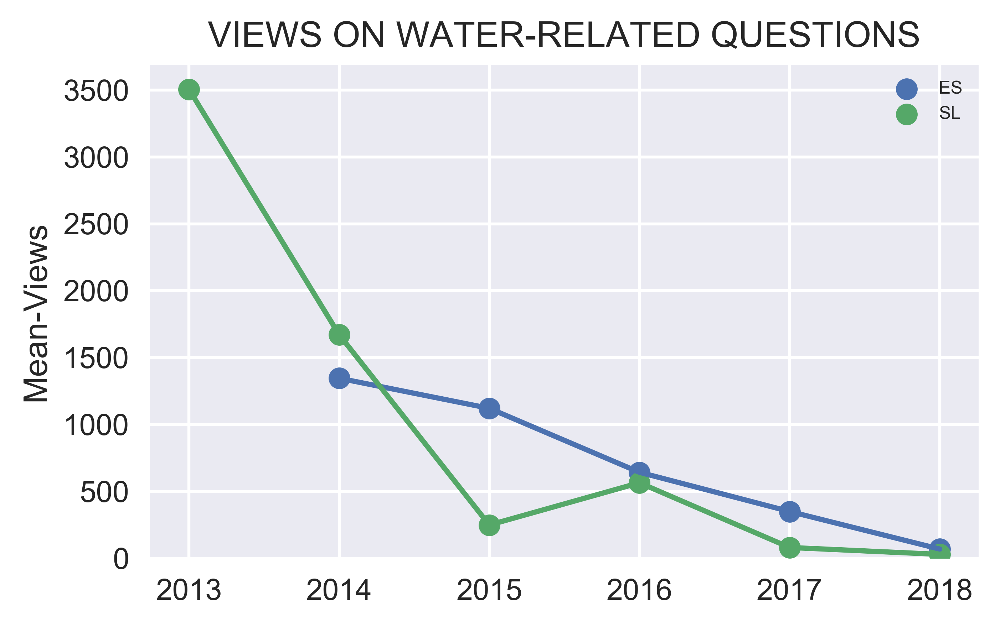

In [41]:
# Adding ES and SL together to a single plot
sns.set()
def addWebsites(para):
    ext=''
    if para==1:
        ext='all.all'
        
    for fname in datamap:
        sumData=OrderedDict()
        #data=pickle.load(open(folder+fname+ext+".pickle","rb"))
        data=pickle.load(open(folder+fname+"vc"+ext+".pickle","rb"))
        
        for year in data:
            if year not in sumData:
                sumData[year]=0
            sumData[year]+=np.mean(data[year])
    
    return sumData
   
#data=addWebsites(0)
data_all=addWebsites(1)
plot_monthly_bargraph(data_all,data,"Earth-Science & Sustainability-Living","Water-related Questions",0)

#for fname in datamap:
data1=pickle.load(open(folder+"ES"+"vcall.all.pickle","rb"))
data2=pickle.load(open(folder+"SL"+"vcall.all.pickle","rb"))
plot_yearly(data1,data2,"Views on Water-related Questions","Mean-Views",0)

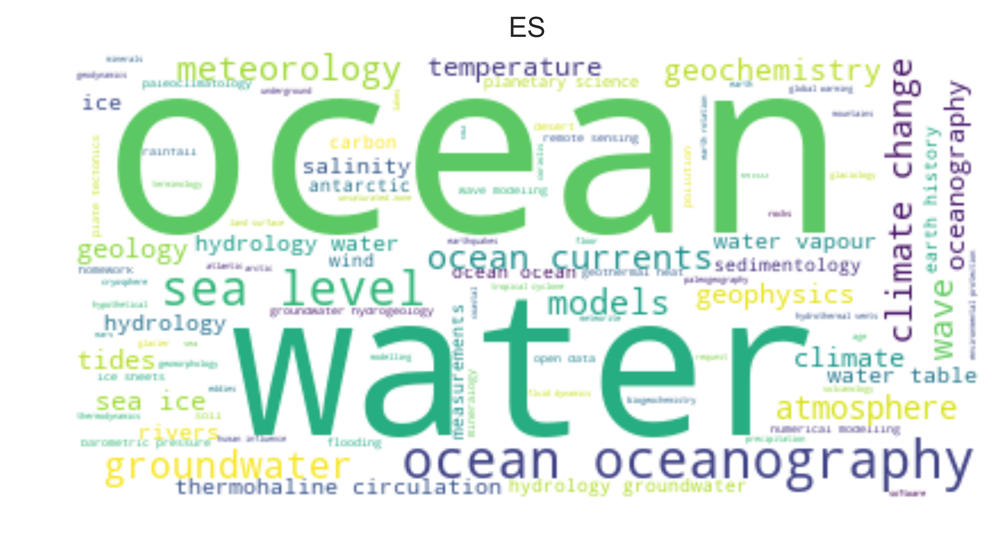

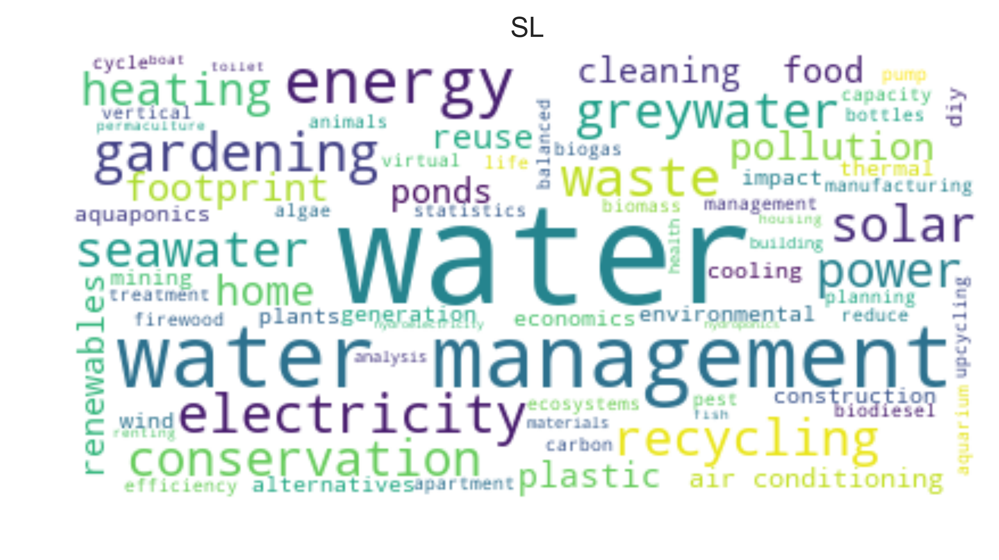

In [69]:
from os import path
from wordcloud import WordCloud



# Read the whole text.
xticks=["ES","SL"]
for fname,names in zip(list(datamap.keys()),xticks):
    
    plt.close()
    plt.clf()
    data=pickle.load(open(folder+fname+".tags.pickle","rb"))
    #print(data)
    text=",".join(data)
    # Generate a word cloud image
    wordcloud = WordCloud(background_color="white").generate(text)

    # Display the generated image:
    # the matplotlib way:
    import matplotlib.pyplot as plt
    
    plt.subplots(figsize=(7,4),dpi=800)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(names)
    plt.axis("off")
    plt.show()
    #plt.savefig("greater5/"+names+".png",bbox_inches='tight')
    # lower max_font_size
    wordcloud = WordCloud(max_font_size=40).generate(text)
    plt.figure()
   
    plt.imshow(wordcloud, cmap=plt.cm.gray, interpolation='bilinear')
    plt.axis("off")

In [127]:
# Write Word Cloud in file

xticks=["ES","SL"]
for fname,names in zip(list(datamap.keys()),xticks):
    f=open(folder+fname+".wordcloud.csv","w")
    f.write("Tags,Frequency\n")
    data=pickle.load(open(folder+fname+".tags.pickle","rb"))
    
    wcloud=Counter(data)
    for i in wcloud:
        f.write(i+","+str(wcloud[i])+"\n")
    f.close()
    

In [44]:
def getuserlocation():
    for fname in list(datamap.keys()):
        if fname=="stackoverflow" and datamap[fname]=="stackoverflow.com-":
            datamap[fname]=datamap[fname]+"Users"   
    
        f=open("data/"+datamap[fname]+"/Users.xml","rb")
        next(f)
        next(f)
        data=[]
        count=0
        userData=pickle.load(open(folder+fname+".userid.pickle","rb"))
        userids=[i for i in userData]
        ndata={}
        for l in f:
            try:
                row=etree.XML(l)      
                userid=row.get("Id") 
                location=row.get("Location")
                if location:
                    location=location.replace(",","-")
#                 if location and len(location.split(","))>1:
#                     location=location.split(",")[-1].strip()
                if userid in userids and location:
                    data.append(location)
                    if location not in ndata:
                        ndata[location]=[]
                    ndata[location].append(userData[userid])

            except:
                print(l)
        #print(Counter(data))
        print(ndata)
        f=open(folder+fname+".location2.csv","w")
        f.write("User Location, Question-ID(s)\n")
        for i in ndata:
            try:
                f.write(i+","+"-".join(ndata[i])+"\n")
            except:
                pass
        f.close()
        print("*"*100)
    return ndata
        

In [45]:
ndata=getuserlocation()

b'</users>'
{'Reading- England': ['189'], 'Seattle- WA': ['2225', '6528'], 'United States': ['2487', '4324', '8178', '10784'], 'Europe': ['762', '331'], 'Playa del Rey- Los Angeles- CA- United States': ['49'], 'UK': ['8569'], 'New York- NY- United States': ['4747', '8027'], 'Australia': ['75', '2420'], 'Pécs- Hungary': ['71'], 'India': ['2275', '8418', '8049'], 'Stockholm- Sweden': ['3020'], 'Berlin- Germany': ['277', '5432'], 'Prague- Czech Republic; Paris- France': ['316'], 'Szczecin- Poland': ['4315'], 'Massachusetts- USA': ['10414'], 'Thailand': ['608'], 'Netherlands': ['609', '4326'], 'Urbana- IL': ['2379'], 'The Pillars of Creation- NGC 6611': ['6750'], 'Germany': ['6547'], 'Strasbourg- France': ['834'], 'Uruguay': ['915'], 'Madrid': ['6728'], 'Delhi- India': ['12462'], 'Washington': ['13341'], 'Alphen aan Den Rijn- The Netherlands': ['9607'], 'Hyderabad': ['2137'], 'Chicago': ['2236'], '127.0.0.1': ['2425'], 'Canberra- Australia': ['6749'], 'Nagpur- India': ['7532'], 'Probably n

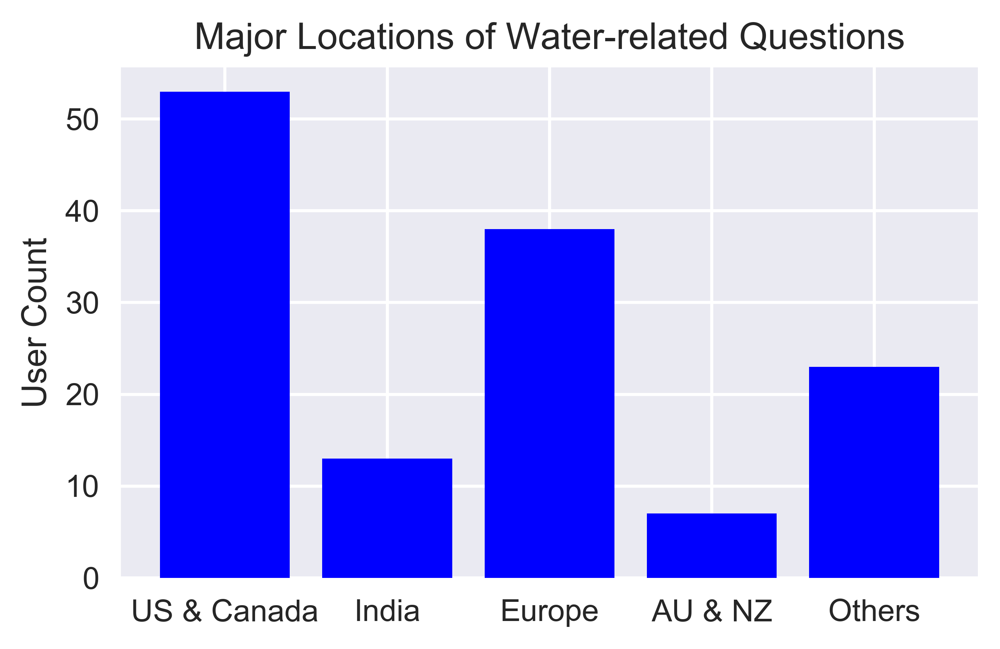

In [46]:
location={}
location["US & Canada"]=35+18
location["India"]=10+3
location["Europe"]=27+11
location["AU & NZ"]=4+3
location["Others"]=20+3
data=location
opr=0
title="Major Locations of Water-related Questions"
ylabel="User Count"
plt.close()
plt.clf()
plt.subplots(figsize=(5,3),dpi=600)

y=[data[i] for i in data]
x=[i for i in range(len(data))]
xticks=[i.split('-')[0] for i in data]

plt.bar(x,y,color='b')
gap=1
plt.xticks(x[::gap],xticks[::gap])
plt.title(title)
plt.ylabel(ylabel)
if opr==1:
    plt.savefig("Images/"+title+".png")
else:
    plt.show()
plt.clf()